In [ ]:
import torch
import numpy as np
print(torch.cuda.is_available())
print(torch.cuda.device_count())


In [2]:
import torch
cuda_available = torch.cuda.is_available()
print("CUDA is available:", cuda_available)

torch.device("cuda" if cuda_available else "cpu")

CUDA is available: True


device(type='cuda')

In [3]:
!ls

 B23BB1037					  covid_model_CNN.pth
 COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset   COVID_Resnet18.ipynb
'COVID_CNN (1).ipynb'				  IML_16_B23BB1037.zip
 COVID_CNN_Final.ipynb				  metadata.csv
 COVID_CNN.ipynb


## Loading Dataset

In [4]:
import pandas as pd

df = pd.read_csv("metadata.csv")

df.head(10)

,directory,class
0,covid/COVID19(308).jpg,1
1,covid/COVID-19 (839).jpg,1
2,covid/COVID-19 (105).jpg,1
3,covid/COVID-19 (379).jpg,1
4,covid/COVID19(443).jpg,1
5,covid/COVID19(282).jpg,1
6,covid/COVID19(433).jpg,1
7,covid/COVID-19 (725).jpg,1
8,covid/COVID-19 (378).jpg,1
9,covid/COVID19(533).jpg,1


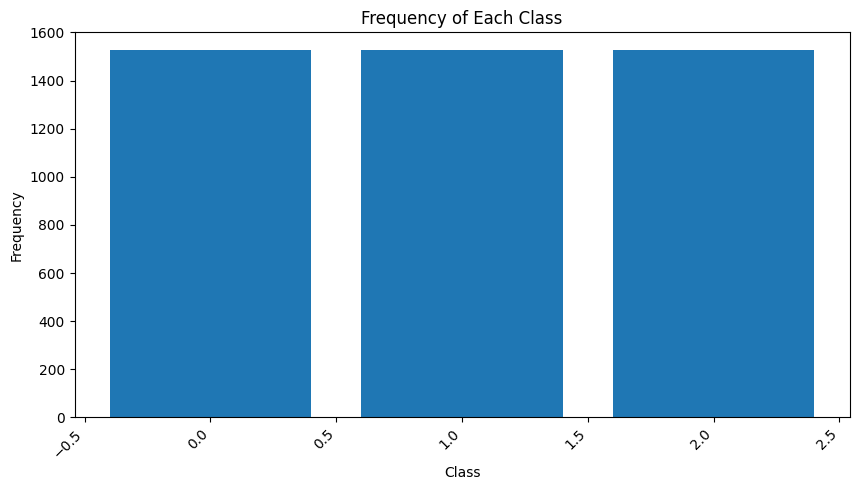

In [5]:
import matplotlib.pyplot as plt

class_counts = df.iloc[:, 1].value_counts()

plt.figure(figsize=(10, 5))
plt.bar(class_counts.index, class_counts.values)
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.title('Frequency of Each Class')
plt.xticks(rotation=45, ha='right')
plt.show()

### Code Explanation
- `df.isna().sum()`:
  - `df.isna()` creates a DataFrame of the same shape as `df`, with `True` for each missing value (`NaN`) and `False` otherwise.
  - `.sum()` calculates the sum of `True` values (i.e., missing values) for each column.

### Output
- The output shows the total number of missing values for each column, enabling a quick assessment of data completeness in `df`.


In [6]:
df.isna().sum()

directory    0
class        0
dtype: int64

### Code Explanation
- `class_counts = df.iloc[:, 1].value_counts()`:
  - `df.iloc[:, 1]` selects the second column of the DataFrame (using zero-based indexing).
  - `.value_counts()` computes the frequency of each unique value in this column.
- `class_counts`: Stores the resulting series, where the index represents the unique values, and the values represent the counts.

### Output
- `class_counts` displays the number of occurrences for each unique item in the specified column, allowing an overview of class distribution or other categorical data in the second column.


In [7]:
class_counts = df.iloc[:, 1].value_counts()
class_counts

class
1    1525
2    1525
0    1525
Name: count, dtype: int64

In [8]:
!ls

 B23BB1037					  covid_model_CNN.pth
 COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset   COVID_Resnet18.ipynb
'COVID_CNN (1).ipynb'				  IML_16_B23BB1037.zip
 COVID_CNN_Final.ipynb				  metadata.csv
 COVID_CNN.ipynb


### Import Statements
- Imports necessary libraries:
  - `matplotlib.pyplot as plt` — for plotting images.
  - `os` — for file path operations.
  - `PIL.Image` — to open image files.

### Data Preparation
- `metadata`: Assigned from a DataFrame `df` that contains metadata about images, including each image's class and file path.
- `sample_images`: Selects one sample image for each class by grouping `metadata` by the 'class' column, taking the first image from each group, and resetting the index.

### Plotting Images
- Creates a figure with subplots:
  - `fig, axes = plt.subplots(1, len(sample_images), figsize=(15, 5))` — creates a single row of subplots, one for each class sample.
- Iterates over `sample_images`:
  - For each sample, constructs the image path using the 'directory' field.
  - Checks if the file exists:
    - If the file exists:
      - Opens the image and displays it in the corresponding subplot.
      - Turns off the axis and sets the title to the class name.
    - If the file does not exist, prints an error message with the image path.

### Displaying the Plot
- Adjusts layout for a clean appearance using `plt.tight_layout()`.
- Displays the plot with `plt.show()`.

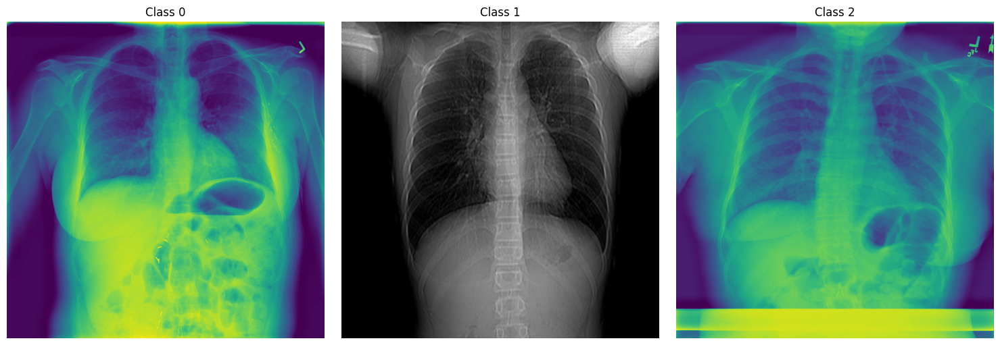

In [9]:
import matplotlib.pyplot as plt
import os
from PIL import Image

metadata = df

sample_images = metadata.groupby('class').first().reset_index()

fig, axes = plt.subplots(1, len(sample_images), figsize=(15, 5))

for idx, (index, row) in enumerate(sample_images.iterrows()):
    img_path = "COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/" + row['directory']

    if os.path.exists(img_path):
        img = Image.open(img_path)
        axes[idx].imshow(img)
        axes[idx].axis('off')
        axes[idx].set_title(f'Class {row["class"]}')
    else:
        print(f"Image not found: {img_path}")

plt.tight_layout()
plt.show()


In [10]:
import torchvision
import random
import torch
import os

%matplotlib inline

torch.manual_seed(0)


In [11]:
!ls

 B23BB1037					  covid_model_CNN.pth
 COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset   COVID_Resnet18.ipynb
'COVID_CNN (1).ipynb'				  IML_16_B23BB1037.zip
 COVID_CNN_Final.ipynb				  metadata.csv
 COVID_CNN.ipynb


In [13]:
"""
import shutil

folder_path = 'COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/test'

if os.path.exists(folder_path):
  shutil.rmtree(folder_path)
  print(f"Folder '{folder_path}' deleted successfully.")
else:
  print(f"Folder '{folder_path}' does not exist.")
"""

'\nimport shutil\n\nfolder_path = \'COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/test\'\n\nif os.path.exists(folder_path):\n  shutil.rmtree(folder_path)\n  print(f"Folder \'{folder_path}\' deleted successfully.")\nelse:\n  print(f"Folder \'{folder_path}\' does not exist.")\n'

### Setup and Folder Creation
- Defines:
  - `class_names`: `['normal', 'pneumonia', 'covid']` — the categories of images.
  - `root_dir`: the root directory where the dataset is stored.
- Checks if the directory for the 'pneumonia' class exists within `root_dir`. If it does, it proceeds with further operations.

### Renaming Source Directories
- Creates a new directory named `test` under `root_dir` if it doesn’t already exist.
- Iterates through `source_dirs` and renames each source directory (originally lowercase names) to match the `class_names`, ensuring consistency in folder naming.

### Creating Test Subdirectories
- For each class in `class_names`, creates a subdirectory within the `test` directory. This results in:
  - `test/normal`
  - `test/pneumonia`
  - `test/covid`

### Selecting and Moving Images to Test Set
- For each class folder:
  - Retrieves the list of images (`jpg`, `jpeg`, or `png`) in the directory.
  - Randomly selects 30 images.
  - Moves each selected image from the original class directory to the corresponding `test` subdirectory.


In [14]:
class_names = ['normal', 'pneumonia', 'covid']
root_dir    = 'COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset'
source_dirs = ['normal', 'pneumonia', 'covid']

if os.path.isdir(os.path.join(root_dir, source_dirs[1])):
    os.mkdir(os.path.join(root_dir, 'test'))

    for i, d in enumerate(source_dirs):
        os.rename(os.path.join(root_dir, d), os.path.join(root_dir, class_names[i]))

    for c in class_names:
        os.mkdir(os.path.join(root_dir, 'test', c))

    for c in class_names:
        images = [x for x in os.listdir(os.path.join(root_dir, c)) if x.lower().endswith('jpg') or x.lower().endswith('png') or x.lower().endswith('jpeg')]
        selected_images = random.sample(images, 30)
        for image in selected_images:
            source_path = os.path.join(root_dir, c, image)
            target_path = os.path.join(root_dir, 'test', c, image)
            shutil.move(source_path, target_path)

FileExistsError: [Errno 17] File exists: 'COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/test'

### 1. Class Definition
- **Class Name**: `ChestXRayDataset`
- **Inherits From**: `torch.utils.data.Dataset`, allowing it to integrate seamlessly with PyTorch's data loading utilities.

### 2. Constructor (`__init__`)
- **Parameters**:
  - `image_dirs`: A dictionary containing paths to the directories of images for each class.
  - `transform`: A function or set of transformations to apply to the images upon loading.

- **Inner Function - `get_images(class_name)`**:
  - Takes a class name and retrieves all image filenames from the corresponding directory.
  - Filters for files ending with `.jpg`, `.png`, or `.jpeg`.
  - Prints the number of images found for that class.

- **Attributes**:
  - `self.images`: A dictionary that stores lists of image filenames for each class.
  - `self.class_names`: A list of class names: `['normal', 'pneumonia', 'covid']`.

- **Image Loading**:
  - Iterates over `self.class_names` and populates `self.images` using the `get_images` function.

### 3. Length Method (`__len__`)
- Returns the total number of images across all classes by summing the lengths of the lists in `self.images`.

### 4. Item Retrieval Method (`__getitem__`)
- **Parameters**: `index` — the index of the image to retrieve.
- **Process**:
  - Randomly selects a class from `self.class_names`.
  - Computes the index of the image within the selected class using `index % len(self.images[class_name])` to ensure it stays within bounds.
  - Constructs the full image path and opens the image, converting it to RGB format.
  - Returns the transformed image and the corresponding class index (using the position of `class_name` in `self.class_names`).


In [16]:
class ChestXRayDataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
        def get_images(class_name):
            images = [x for x in os.listdir(image_dirs[class_name]) if x.lower().endswith('jpg') or x.lower().endswith('png') or x.lower().endswith('jpeg')]
            print(f'Found {len(images)} {class_name} examples')
            return images

        self.images = {}
        self.class_names = ['normal', 'pneumonia', 'covid']

        for c in self.class_names:
            self.images[c] = get_images(c)

        self.image_dirs = image_dirs
        self.transform = transform

    def __len__(self):
        return sum([len(self.images[c]) for c in self.class_names])

    def __getitem__(self, index):
        class_name = random.choice(self.class_names)
        index = index%len(self.images[class_name])
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        image = Image.open(image_path).convert('RGB')
        return self.transform(image), self.class_names.index(class_name)

### Training Transformations (`train_transform`)
- **Purpose**: Prepares images for training by applying a series of transformations to enhance model robustness.
- **Transformations**:
  - `torchvision.transforms.Resize(size=(224, 224))`: Resizes each image to 224x224 pixels.
  - `torchvision.transforms.RandomHorizontalFlip()`: Randomly flips images horizontally with a 50% chance, providing augmentation that helps improve model generalization.
  - `torchvision.transforms.ToTensor()`: Converts images from PIL format or numpy arrays to PyTorch tensors. This transformation also scales pixel values to the range [0, 1].
  - `torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])`: Normalizes the tensor images using the specified mean and standard deviation for each channel (RGB). These values are typically used for models pre-trained on ImageNet.

### Testing Transformations (`test_transform`)
- **Purpose**: Prepares images for testing without applying data augmentation, ensuring that the evaluation is consistent and deterministic.
- **Transformations**:
  - `torchvision.transforms.Resize(size=(224, 224))`: Resizes each image to 224x224 pixels.
  - `torchvision.transforms.ToTensor()`: Converts images to PyTorch tensors and scales pixel values to the range [0, 1].
  - `torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])`: Normalizes the tensor images using the same mean and standard deviation as used in the training transformations.


In [17]:
train_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size = (224, 224)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
])
test_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size = (224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [18]:
train_dirs = {
    'normal': 'COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/normal',
    'pneumonia': 'COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/pneumonia',
    'covid': 'COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/covid'
}
train_dataset = ChestXRayDataset(train_dirs, train_transform)

Found 1495 normal examples
Found 1495 pneumonia examples
Found 1495 covid examples


In [19]:
test_dirs = {
    'normal': 'COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/test/normal',
    'pneumonia': 'COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/test/pneumonia',
    'covid': 'COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/test/covid'
}
test_dataset = ChestXRayDataset(test_dirs, test_transform)

Found 30 normal examples
Found 30 pneumonia examples
Found 30 covid examples


In [20]:
batch_size = 5

dl_train = torch.utils.data.DataLoader(train_dataset, batch_size = batch_size, shuffle = True)
dl_test = torch.utils.data.DataLoader(test_dataset, batch_size = batch_size, shuffle = True)

print('Number of training batches', len(dl_train))
print('Number of test batches', len(dl_test))

Number of training batches 897
Number of test batches 18


In [21]:
class_names = train_dataset.class_names

def show_images(images, labels, preds):
    plt.figure(figsize=(16, 9))
    for i, image in enumerate(images):
        plt.subplot(1, 6, i + 1, xticks = [], yticks = [])
        image = image.numpy().transpose((1, 2, 0))
        mean  = np.array([0.485, 0.456, 0.406])
        std   = np.array([0.229, 0.224, 0.225])
        image = image*std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col   = 'green'
        if preds[i] != labels[i]:
            col = 'red'

        plt.xlabel(f'{class_names[int(labels[i].numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].numpy())]}', color = col)
    plt.tight_layout()
    plt.show()

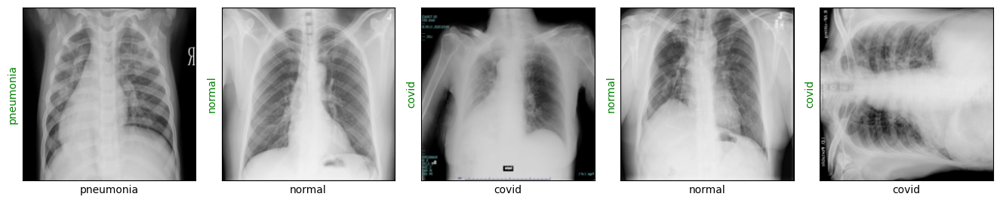

In [22]:
images, labels = next(iter(dl_train))
show_images(images, labels, labels)

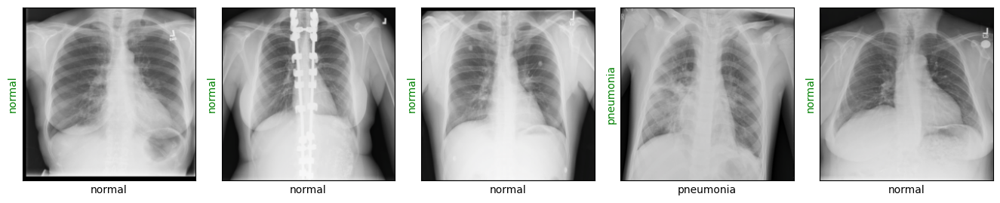

In [23]:
images, labels = next(iter(dl_test))
show_images(images, labels, labels)

## CNN Architecture

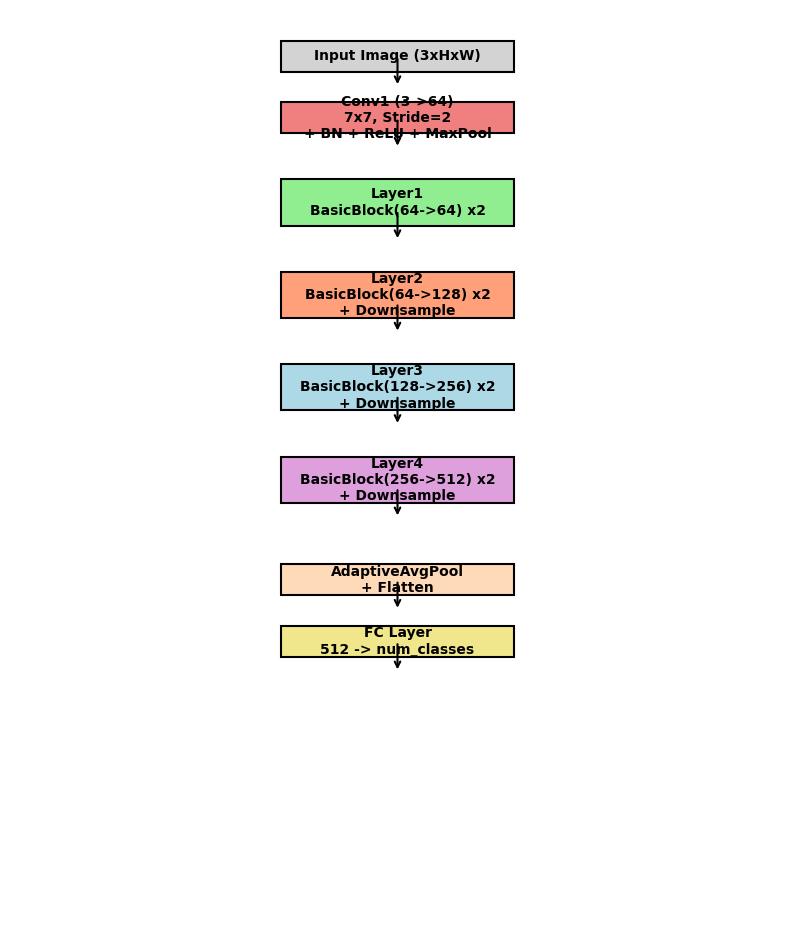

In [24]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def add_layer(ax, x, y, width, height, text, color='skyblue'):
    rect = patches.Rectangle((x, y), width, height, linewidth=1.5, edgecolor='black', facecolor=color)
    ax.add_patch(rect)
    ax.text(x + width / 2, y + height / 2, text, ha='center', va='center', fontsize=10, weight='bold', color='black')

fig, ax = plt.subplots(figsize=(10, 12))
ax.set_xlim(0, 10)
ax.set_ylim(0, 30)
ax.axis('off')
add_layer(ax, 3.5, 28, 3, 1, 'Input Image (3xHxW)', color='lightgrey')
add_layer(ax, 3.5, 26, 3, 1, 'Conv1 (3->64)\n7x7, Stride=2\n+ BN + ReLU + MaxPool', color='lightcoral')
add_layer(ax, 3.5, 23, 3, 1.5, 'Layer1\nBasicBlock(64->64) x2', color='lightgreen')
add_layer(ax, 3.5, 20, 3, 1.5, 'Layer2\nBasicBlock(64->128) x2\n+ Downsample', color='lightsalmon')
add_layer(ax, 3.5, 17, 3, 1.5, 'Layer3\nBasicBlock(128->256) x2\n+ Downsample', color='lightblue')
add_layer(ax, 3.5, 14, 3, 1.5, 'Layer4\nBasicBlock(256->512) x2\n+ Downsample', color='plum')
add_layer(ax, 3.5, 11, 3, 1, 'AdaptiveAvgPool\n+ Flatten', color='peachpuff')
add_layer(ax, 3.5, 9, 3, 1, 'FC Layer\n512 -> num_classes', color='khaki')
arrow_params = dict(arrowstyle='->', color='black', lw=1.5)
ax.annotate('', xy=(5, 27.5), xytext=(5, 28.5), arrowprops=arrow_params)
ax.annotate('', xy=(5, 25.5), xytext=(5, 26.5), arrowprops=arrow_params)
ax.annotate('', xy=(5, 22.5), xytext=(5, 23.5), arrowprops=arrow_params)
ax.annotate('', xy=(5, 19.5), xytext=(5, 20.5), arrowprops=arrow_params)
ax.annotate('', xy=(5, 16.5), xytext=(5, 17.5), arrowprops=arrow_params)
ax.annotate('', xy=(5, 13.5), xytext=(5, 14.5), arrowprops=arrow_params)
ax.annotate('', xy=(5, 10.5), xytext=(5, 11.5), arrowprops=arrow_params)
ax.annotate('', xy=(5, 8.5), xytext=(5, 9.5), arrowprops=arrow_params)

plt.show()

In [25]:
import torch.nn as nn

class BasicBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1, downsample=None):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.downsample = downsample

    def forward(self, x):
        identity = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        if self.downsample is not None:
            identity = self.downsample(x)
        out += identity
        out = self.relu(out)
        return out

class CustomCNN(nn.Module):
    def __init__(self, num_classes=3):
        super(CustomCNN, self).__init__()

        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = nn.Sequential(
            BasicBlock(64, 64),
            BasicBlock(64, 64)
        )

        self.layer2 = nn.Sequential(
            BasicBlock(64, 128, stride=2, downsample=nn.Sequential(
                nn.Conv2d(64, 128, kernel_size=1, stride=2, bias=False),
                nn.BatchNorm2d(128)
            )),
            BasicBlock(128, 128)
        )

        self.layer3 = nn.Sequential(
            BasicBlock(128, 256, stride=2, downsample=nn.Sequential(
                nn.Conv2d(128, 256, kernel_size=1, stride=2, bias=False),
                nn.BatchNorm2d(256)
            )),
            BasicBlock(256, 256)
        )

        self.layer4 = nn.Sequential(
            BasicBlock(256, 512, stride=2, downsample=nn.Sequential(
                nn.Conv2d(256, 512, kernel_size=1, stride=2, bias=False),
                nn.BatchNorm2d(512)
            )),
            BasicBlock(512, 512)
        )

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)

        return x

In [26]:
model = CustomCNN(num_classes=3)
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=3e-5)
print(model)

CustomCNN(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)

In [27]:
def show_preds():
    model.eval()
    images, labels = next(iter(dl_test))
    outputs  = model(images)
    index, preds = torch.max(outputs, 1)
    show_images(images, labels, preds)


In [28]:
def train(epochs=1):
    train_losses = []
    val_losses = []
    accuracies = []

    for e in range(epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)

        train_loss = 0.
        val_loss = 0.

        model.train()  # Set model to training phase

        for train_step, (images, labels) in enumerate(dl_train):
            optimizer.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

            if train_step % 20 == 0:
                print('Evaluating at step', train_step)

                accuracy = 0
                model.eval()  # Set model to eval phase

                for val_step, (val_images, val_labels) in enumerate(dl_test):
                    val_outputs = model(val_images)
                    val_loss += loss_fn(val_outputs, val_labels).item()

                    _, preds = torch.max(val_outputs, 1)
                    accuracy += (preds == val_labels).sum().item()

                val_loss /= (val_step + 1)
                accuracy /= len(dl_test.dataset)  # Correct calculation of accuracy
                print(f'Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')
                val_losses.append(val_loss)
                accuracies.append(accuracy)

                show_preds()
                model.train()

                if accuracy >= 0.98:
                    print('98%+ accuracy reached')
                    return train_losses, val_losses, accuracies

        train_loss /= (train_step + 1)
        train_losses.append(train_loss)  # Store the training loss

        print(f'Training Loss: {train_loss:.4f}')

    print('Training complete..')
    return train_losses, val_losses, accuracies

Starting epoch 1/1
Evaluating at step 0
Validation Loss: 1.0932, Accuracy: 0.3778


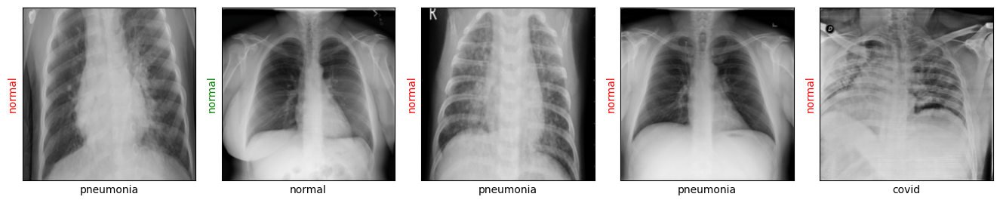

Evaluating at step 20
Validation Loss: 1.1976, Accuracy: 0.4222


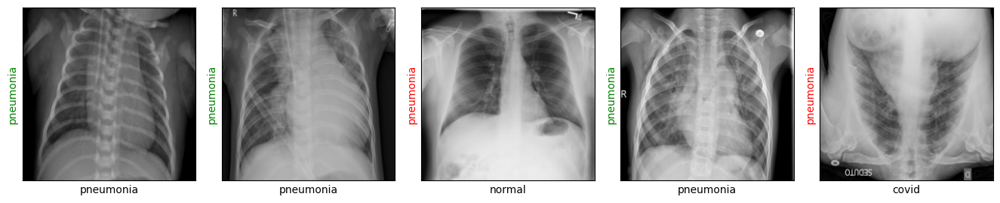

Evaluating at step 40
Validation Loss: 0.7635, Accuracy: 0.6889


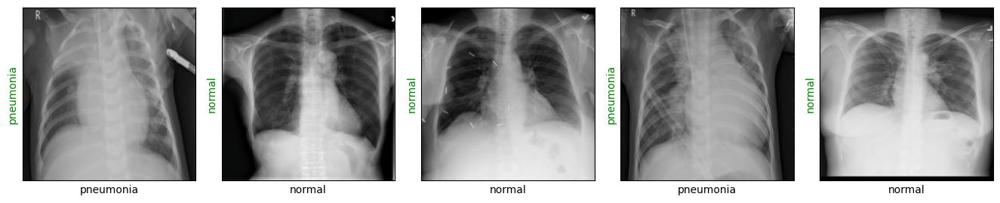

Evaluating at step 60
Validation Loss: 0.7417, Accuracy: 0.7889


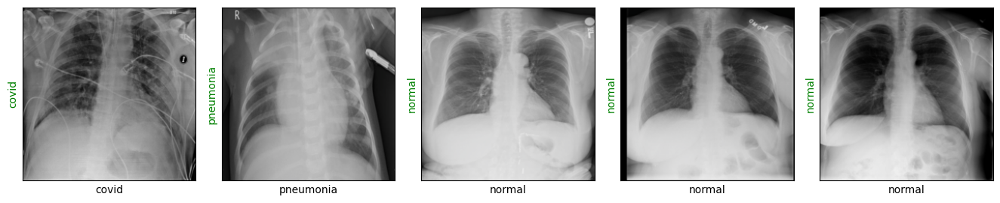

Evaluating at step 80
Validation Loss: 1.1055, Accuracy: 0.6889


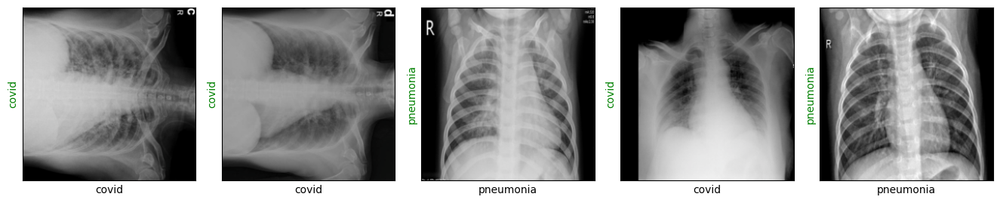

Evaluating at step 100
Validation Loss: 0.9917, Accuracy: 0.6333


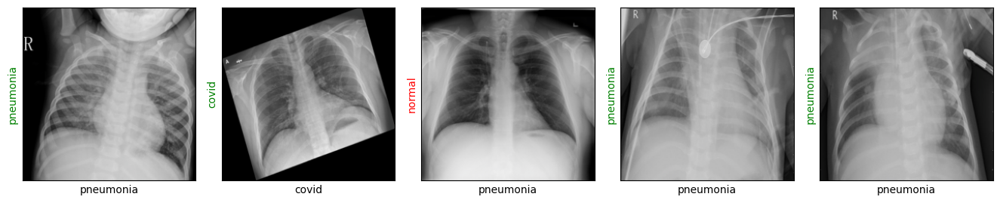

Evaluating at step 120
Validation Loss: 0.8978, Accuracy: 0.5778


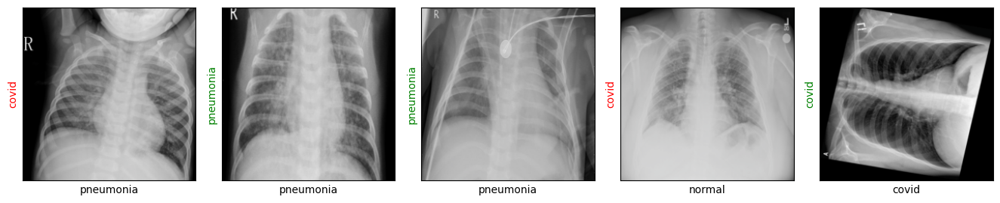

Evaluating at step 140
Validation Loss: 0.5133, Accuracy: 0.8556


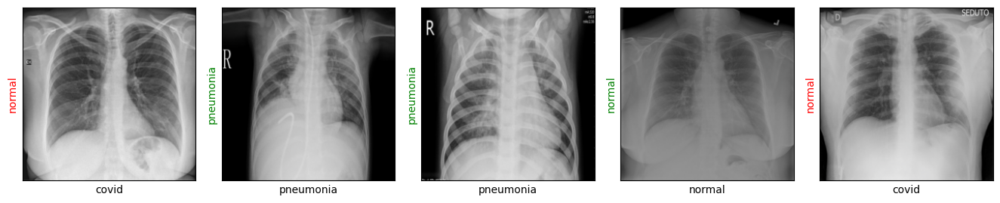

Evaluating at step 160
Validation Loss: 0.7629, Accuracy: 0.6556


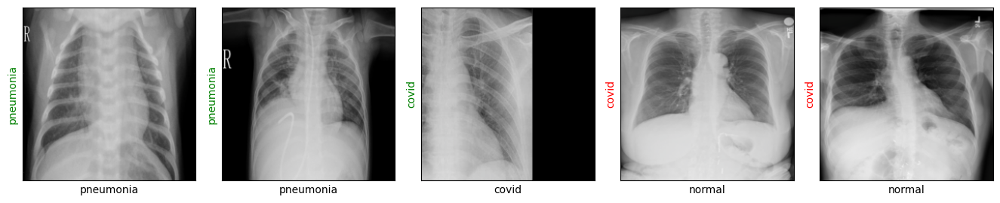

Evaluating at step 180
Validation Loss: 0.5729, Accuracy: 0.8333


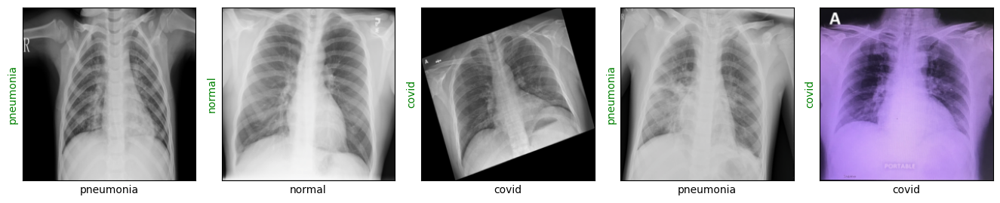

Evaluating at step 200
Validation Loss: 0.5650, Accuracy: 0.7778


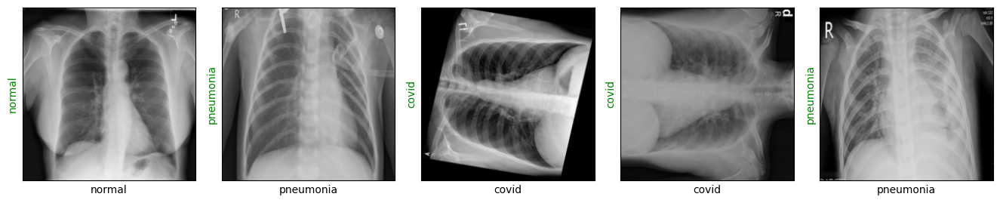

Evaluating at step 220
Validation Loss: 0.5249, Accuracy: 0.7889


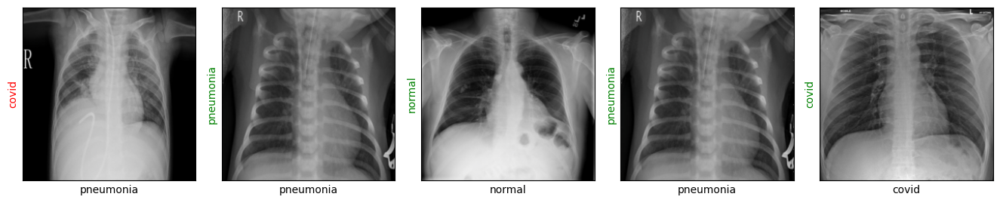

Evaluating at step 240
Validation Loss: 0.6461, Accuracy: 0.8111


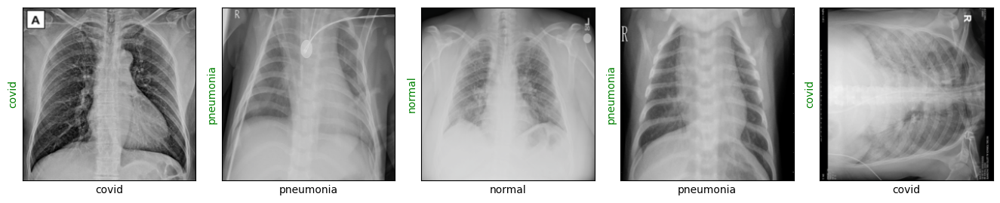

Evaluating at step 260
Validation Loss: 0.6357, Accuracy: 0.8000


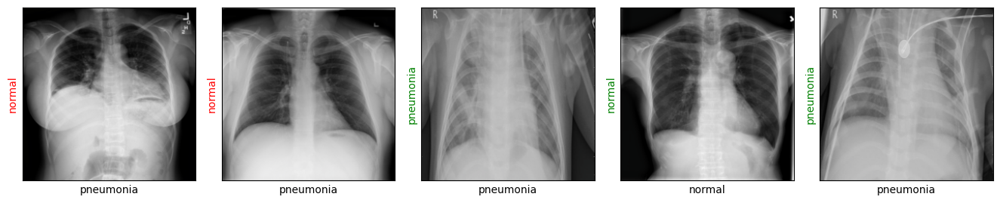

Evaluating at step 280
Validation Loss: 0.3928, Accuracy: 0.8667


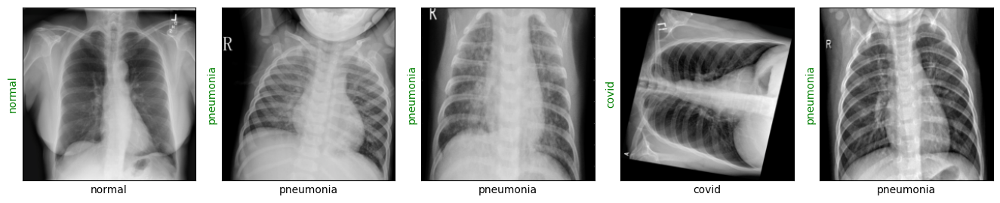

Evaluating at step 300
Validation Loss: 0.2963, Accuracy: 0.8889


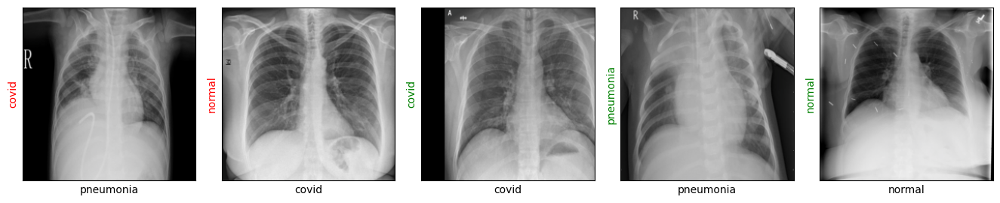

Evaluating at step 320
Validation Loss: 0.4058, Accuracy: 0.8556


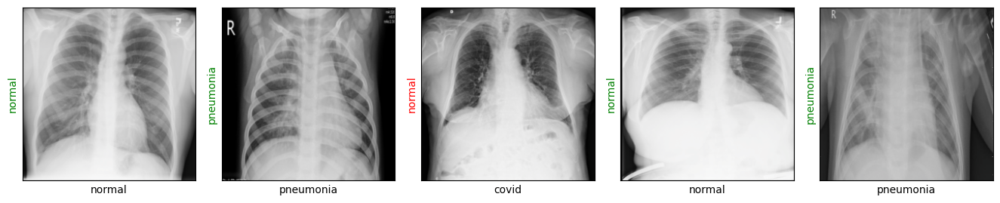

Evaluating at step 340
Validation Loss: 0.4386, Accuracy: 0.8667


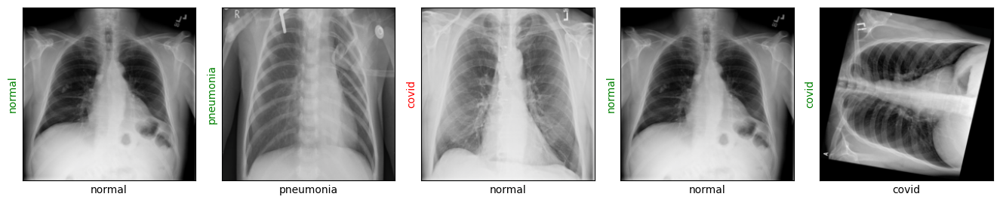

Evaluating at step 360
Validation Loss: 0.3229, Accuracy: 0.9000


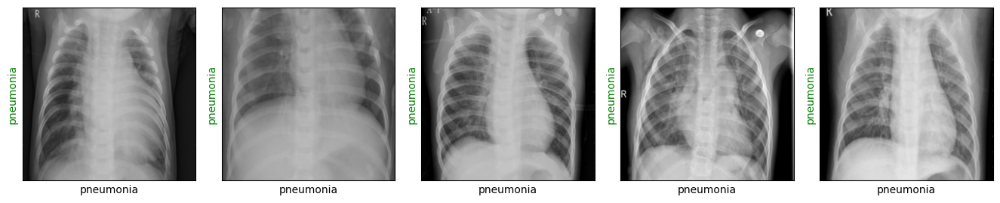

Evaluating at step 380
Validation Loss: 0.3913, Accuracy: 0.8000


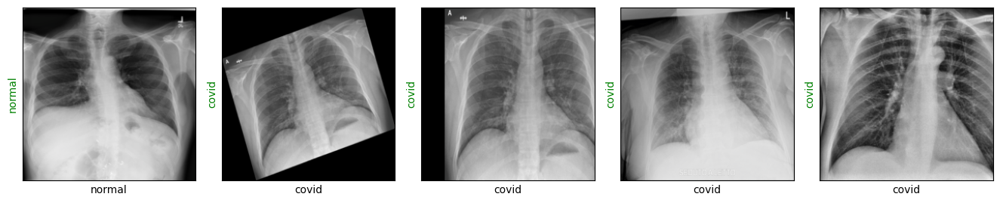

Evaluating at step 400
Validation Loss: 0.8556, Accuracy: 0.7111


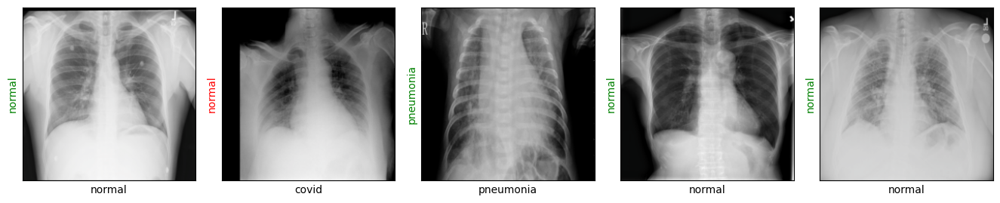

Evaluating at step 420
Validation Loss: 0.3748, Accuracy: 0.9222


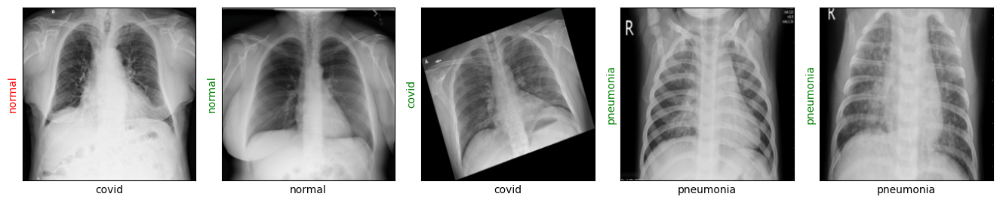

Evaluating at step 440
Validation Loss: 0.4217, Accuracy: 0.8556


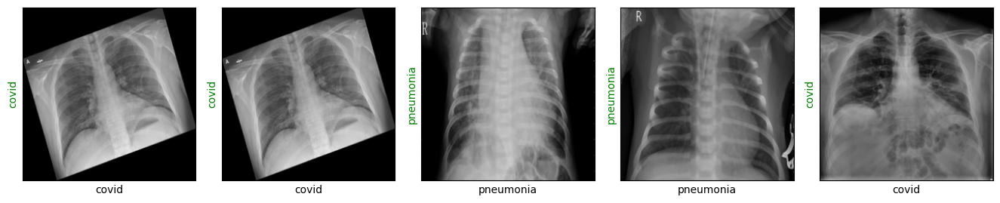

Evaluating at step 460
Validation Loss: 0.3683, Accuracy: 0.9222


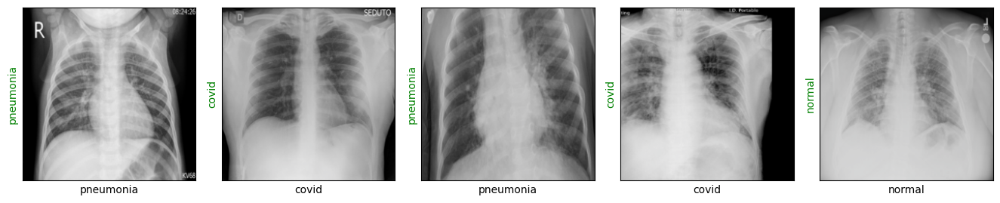

Evaluating at step 480
Validation Loss: 0.4503, Accuracy: 0.8444


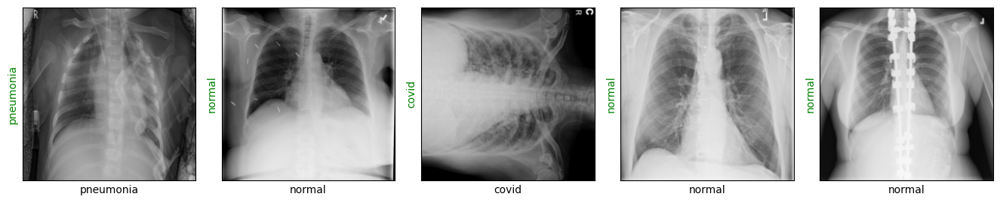

Evaluating at step 500
Validation Loss: 0.3287, Accuracy: 0.8889


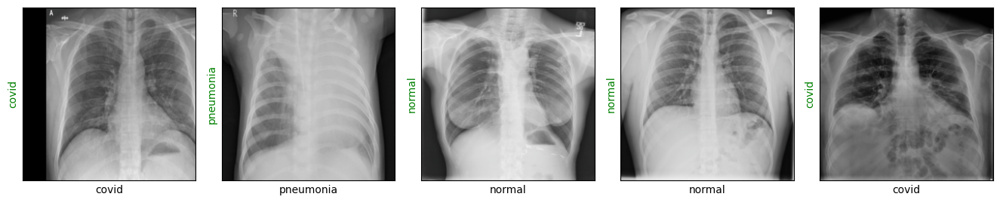

Evaluating at step 520
Validation Loss: 0.3534, Accuracy: 0.8667


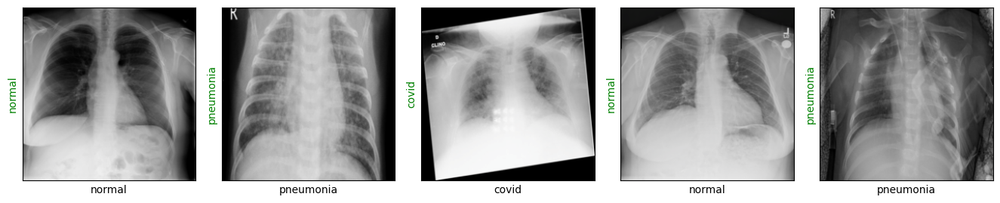

Evaluating at step 540
Validation Loss: 0.3059, Accuracy: 0.9000


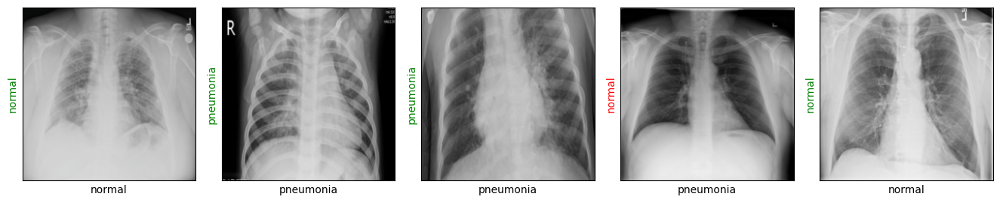

Evaluating at step 560
Validation Loss: 0.3621, Accuracy: 0.8222


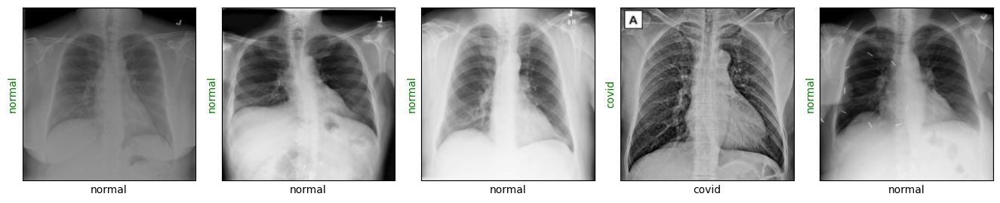

Evaluating at step 580
Validation Loss: 0.3132, Accuracy: 0.8889


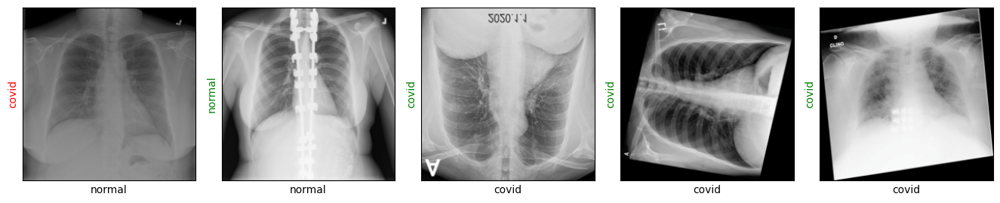

Evaluating at step 600
Validation Loss: 0.3121, Accuracy: 0.9111


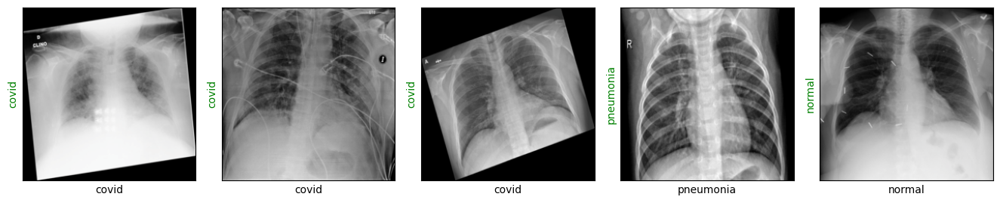

Evaluating at step 620
Validation Loss: 0.5930, Accuracy: 0.7556


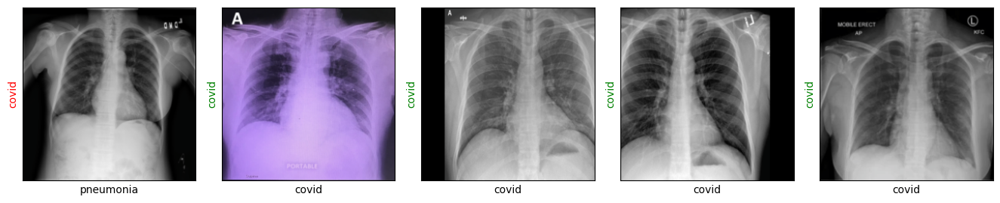

Evaluating at step 640
Validation Loss: 0.4998, Accuracy: 0.8778


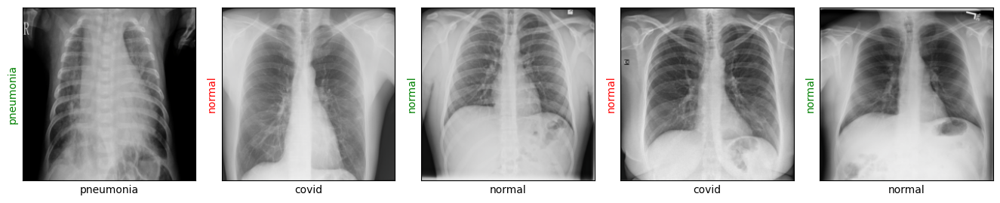

Evaluating at step 660
Validation Loss: 0.4310, Accuracy: 0.8667


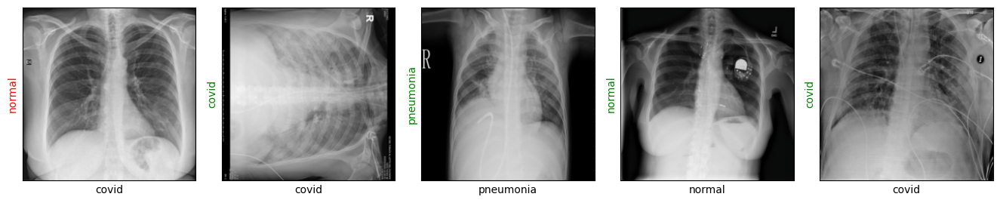

Evaluating at step 680
Validation Loss: 0.3393, Accuracy: 0.9000


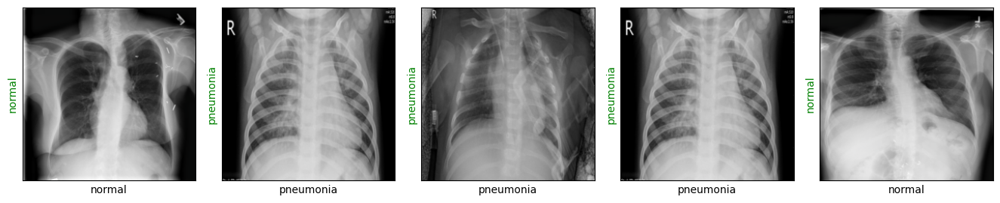

Evaluating at step 700
Validation Loss: 0.5035, Accuracy: 0.8667


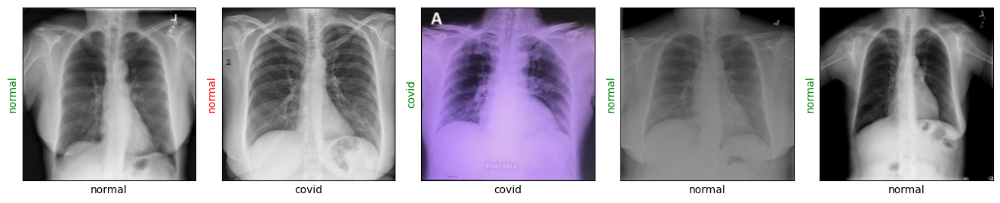

Evaluating at step 720
Validation Loss: 0.4041, Accuracy: 0.8667


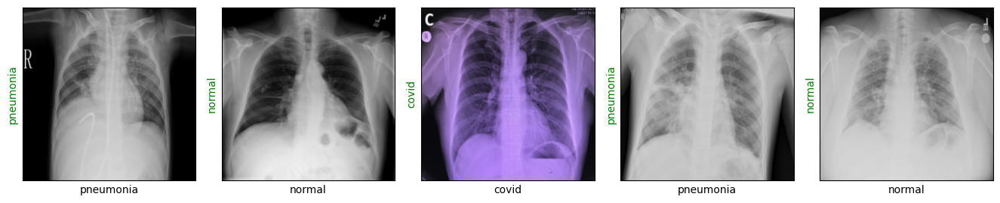

Evaluating at step 740
Validation Loss: 0.3184, Accuracy: 0.9111


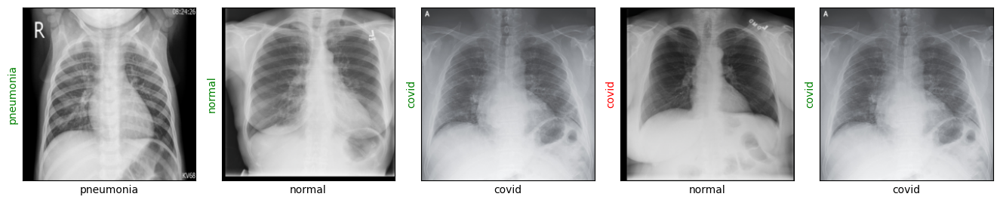

Evaluating at step 760
Validation Loss: 0.3075, Accuracy: 0.8778


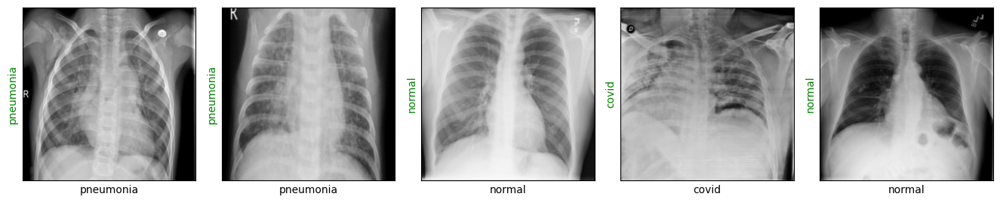

Evaluating at step 780
Validation Loss: 0.2962, Accuracy: 0.9111


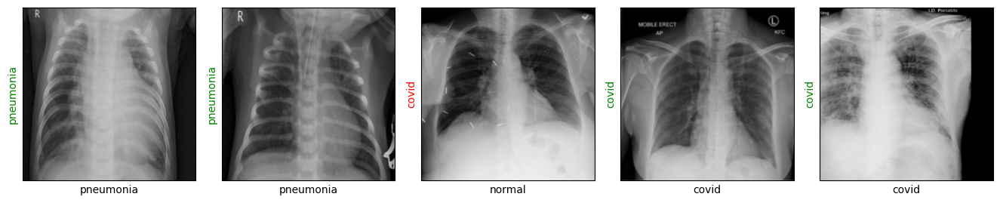

Evaluating at step 800
Validation Loss: 0.3858, Accuracy: 0.8556


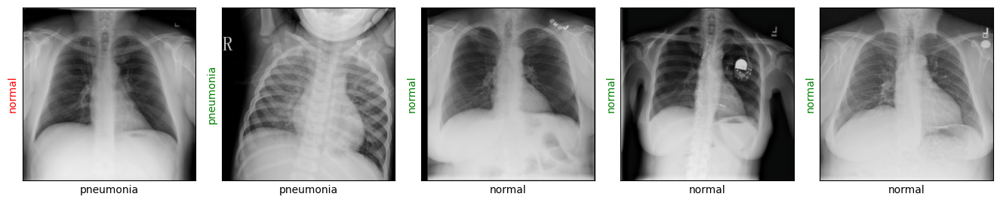

Evaluating at step 820
Validation Loss: 0.4425, Accuracy: 0.8889


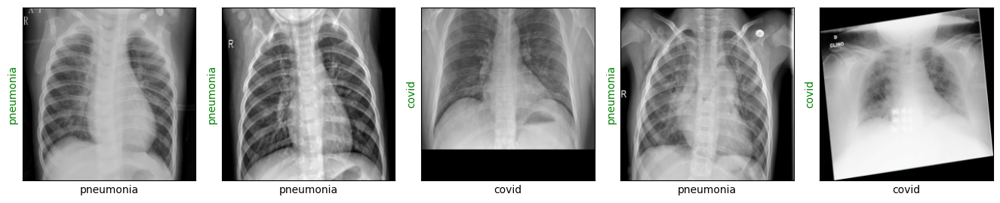

Evaluating at step 840
Validation Loss: 0.2799, Accuracy: 0.9333


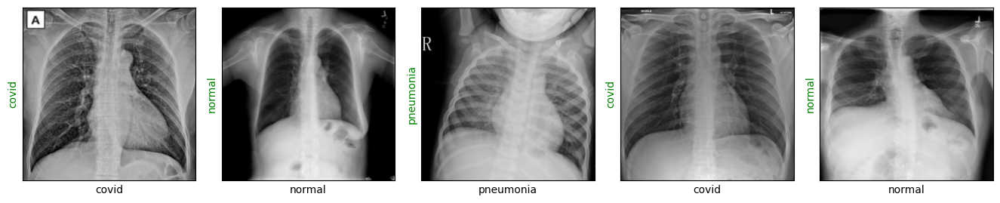

Evaluating at step 860
Validation Loss: 0.3287, Accuracy: 0.9111


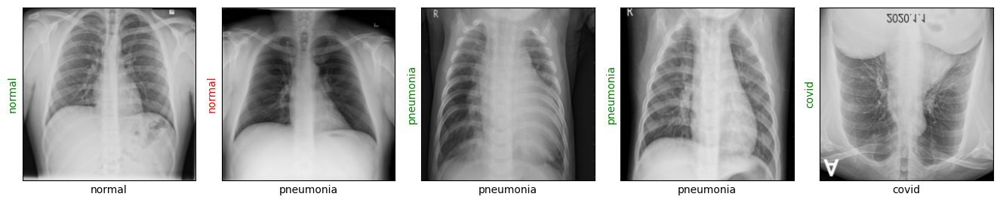

Evaluating at step 880
Validation Loss: 0.3087, Accuracy: 0.8889


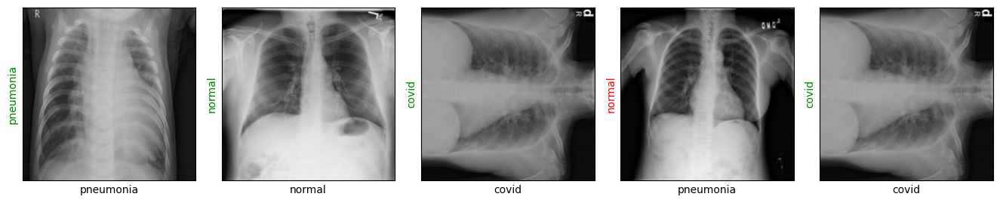

Training Loss: 0.4778
Training complete..


In [29]:
train_losses, val_losses, accuracies = train(epochs=1)

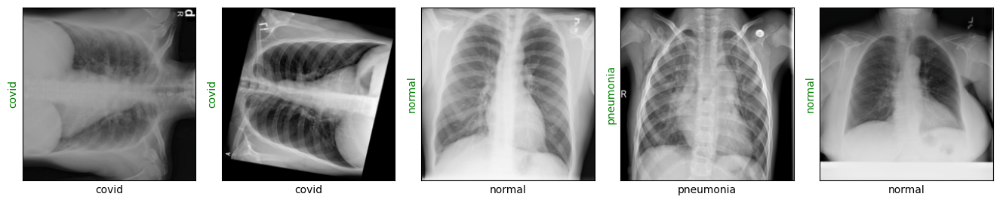

In [30]:
show_preds()

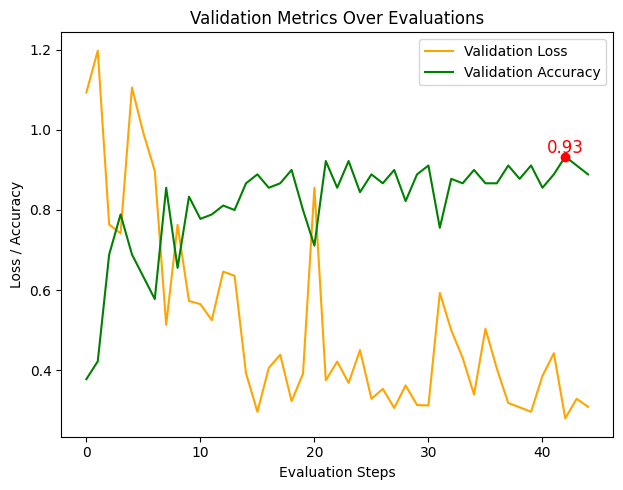

In [31]:
def plot_results(train_losses, val_losses, accuracies):
    eval_steps = range(len(val_losses))
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 2)
    plt.plot(eval_steps, val_losses, label='Validation Loss', color='orange')
    plt.plot(eval_steps, accuracies, label='Validation Accuracy', color='green')

    peak_accuracy_idx = accuracies.index(max(accuracies))
    peak_accuracy = accuracies[peak_accuracy_idx]

    plt.scatter(peak_accuracy_idx, peak_accuracy, color='red', zorder=5)

    plt.text(peak_accuracy_idx, peak_accuracy + 0.01, f'{peak_accuracy:.2f}', 
             color='red', ha='center', fontsize=12)

    plt.title('Validation Metrics Over Evaluations')
    plt.xlabel('Evaluation Steps')
    plt.ylabel('Loss / Accuracy')

    plt.legend()

    plt.tight_layout()
    plt.show()

plot_results(train_losses, val_losses, accuracies)

In [32]:
torch.save(model.state_dict(),'covid_model_CNN.pth')

In [33]:
!ls

 B23BB1037					  covid_model_CNN.pth
 COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset   COVID_Resnet18.ipynb
'COVID_CNN (1).ipynb'				  IML_16_B23BB1037.zip
 COVID_CNN_Final.ipynb				  metadata.csv
 COVID_CNN.ipynb


In [34]:
import torch.nn as nn

model.load_state_dict(torch.load('covid_model_CNN.pth'))
model.eval()

/tmp/ipykernel_6054/2792602305.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('covid_model_CNN.pth'))


CustomCNN(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)

In [35]:
!pip install torchmetrics


[notice] A new release of pip is available: 23.2.1 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [36]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import os
import random
from PIL import Image
import torch.nn.functional as F
from torchmetrics import ConfusionMatrix

In [37]:
test_pred_labels = []
test_true_labels = []
train_pred_labels = []
train_true_labels = []
ps_list = []
ps_list_train = []
running_correct = 0.0
running_total = 0.0
running_correct_train = 0.0
running_total_train = 0.0
accuracy_test=0.0
accuracy_train=0.0

def data_extraction(pred_label, true_label, ps_label, dataset, correct, total, accuracy):
    with torch.no_grad():
        for images, labels in dataset:
            output = model(images)
            output = (torch.max(torch.exp(output), 1)[1]).numpy()
            pred_label.extend(output)
            labels = labels.numpy()
            true_label.extend(labels)
            total += len(labels)
            correct += (output == labels).sum().item()
        accuracy = correct/total
        return pred_label,true_label,ps_label,dataset,correct,total,accuracy

In [38]:
print(len(test_pred_labels))
test_pred_labels.count(2)

0


0

In [39]:
one=data_extraction(test_pred_labels,test_true_labels,ps_list,dl_test,running_correct,running_total,accuracy_test)
print("Total Correct Images: {}, Total Test Images: {}".format(int(one[4]), int(one[5])))
print("Test Accuracy: ", one[6])

Total Correct Images: 78, Total Test Images: 90
Test Accuracy:  0.8666666666666667


In [40]:
two=data_extraction(train_pred_labels,train_true_labels,ps_list_train,dl_train,running_correct_train,running_total_train,accuracy_train)
print("Total Correct Images: {}, Total Train Images: {}".format(int(two[4]), int(two[5])))
print("Train Accuracy: ", two[6])

Total Correct Images: 4055, Total Train Images: 4485
Train Accuracy:  0.9041248606465998


In [41]:
target_train = torch.tensor(two[1])
preds_train = torch.tensor(two[0])
confmat2 = ConfusionMatrix(num_classes=3, task="multiclass")
mat_tensor2 = confmat2(preds_train, target_train)

print(mat_tensor2)

tensor([[1246,  101,  164],
        [ 102, 1397,   26],
        [  19,   18, 1412]])


In [43]:
import sklearn.metrics as metrics
print("Classification report for test set:\n%s\n"
      % (metrics.classification_report(one[1], one[0],target_names=['normal', 'pneumonia', 'covid'])))

print("Classification report for train set:\n%s\n"
      % (metrics.classification_report(two[1], two[0],target_names=['normal', 'pneumonia', 'covid'])))

Classification report for test set:
normal - Precision: 0.81, Recall: 0.84, F1-Score: 0.83
pneumonia - Precision: 0.90, Recall: 0.87, F1-Score: 0.88
covid - Precision: 0.90, Recall: 0.90, F1-Score: 0.90
Classification report for train set:
normal - Precision: 0.91, Recall: 0.82, F1-Score: 0.87
pneumonia - Precision: 0.92, Recall: 0.92, F1-Score: 0.92
covid - Precision: 0.88, Recall: 0.97, F1-Score: 0.93
